# FGSM Adversarial Robustness Evaluation for CARLA

The experiment attacks three binary ResNet18 classifiers:

- pedestrian detector
- traffic light detector
- vehicle detector

The attack used is FGSM:

```text
x_adv = x + epsilon * sign(gradient_x loss)
```


## 1. Setup and Project Paths

This cell defines where the CARLA project lives and where the script writes its outputs.
The notebook uses absolute paths so it can be opened from any Jupyter working directory.


In [1]:
from pathlib import Path
import os
import subprocess
import sys

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image, Markdown, display

PROJECT_ROOT = Path("/Users/gopesh__007/carla_baseline_project")
SCRIPT_PATH = PROJECT_ROOT / "scripts" / "evaluate_adversarial.py"
DATA_DIR = PROJECT_ROOT / "data" / "validation"
IMAGE_DIR = DATA_DIR / "rgb-front"
LABELS_CSV = DATA_DIR / "labels.csv"
OUTPUT_DIR = PROJECT_ROOT / "outputs" / "adversarial"
RESULTS_CSV = OUTPUT_DIR / "adversarial_results.csv"
EXAMPLES_DIR = OUTPUT_DIR / "examples"
PLOTS_DIR = OUTPUT_DIR / "plots"

VENV_PYTHON = PROJECT_ROOT / ".venv" / "bin" / "python"
PYTHON_EXE = VENV_PYTHON if VENV_PYTHON.exists() else Path(sys.executable)

print("Project root:", PROJECT_ROOT)
print("Evaluation script:", SCRIPT_PATH)
print("Python used for rerun:", PYTHON_EXE)
print("Results CSV:", RESULTS_CSV)


Project root: /Users/gopesh__007/carla_baseline_project
Evaluation script: /Users/gopesh__007/carla_baseline_project/scripts/evaluate_adversarial.py
Python used for rerun: /Users/gopesh__007/carla_baseline_project/.venv/bin/python
Results CSV: /Users/gopesh__007/carla_baseline_project/outputs/adversarial/adversarial_results.csv


## 2. The script has eight main parts:


1. **Imports and constants**: loads PyTorch, torchvision, pandas, sklearn metrics, PIL, and matplotlib.
2. **Model specification**: defines the three models, their checkpoint files, and label columns.
3. **Argument/config handling**: supports CPU/CUDA, epsilon values, batch size, sample limit, and output paths.
4. **Dataset loading**: reads `labels.csv`, loads RGB front images, resizes them to `224 x 224`, and converts them to tensors.
5. **Model loading**: builds a ResNet18 with one output logit and loads each `.pth` checkpoint.
6. **FGSM attack**: computes the gradient with respect to the input image and creates adversarial images.
7. **Evaluation**: computes accuracy, recall, F1, and recall drop for clean and attacked images.
8. **Outputs**: saves example images, the recall plot, and the CSV table.


## 3. Dataset Section

The dataset section reads the validation labels and pairs them with images from
`data/validation/rgb-front/`.

Important details:

- the labels used are `has_pedestrian`, `has_traffic_light`, and `has_vehicle`
- images are resized to `224 x 224`
- pixel values are converted to tensors in the range `[0, 1]`
- if there is no image filename column, labels are paired with naturally sorted image files


In [2]:
labels = pd.read_csv(LABELS_CSV)
image_count = len([p for p in IMAGE_DIR.iterdir() if p.suffix.lower() in {".jpg", ".jpeg", ".png", ".bmp"}])

print("Labels shape:", labels.shape)
print("Image count:", image_count)
display(labels.head())


Labels shape: (3600, 7)
Image count: 3600


,frame,has_traffic_light,has_pedestrian,has_vehicle,px_traffic_light,px_pedestrian,px_vehicle
0,0,False,True,False,0,178,10
1,10,True,False,False,347,0,2
2,20,True,False,False,347,0,0
3,30,True,False,False,347,0,0
4,40,True,False,False,347,0,0


## 4. Model Loading Section

Each classifier uses the same architecture:

```python
model = torchvision.models.resnet18(weights=None)
model.fc = torch.nn.Linear(model.fc.in_features, 1)
```

The final layer has one output because this is binary classification. The raw output is a
**logit**. During evaluation, the script applies sigmoid and then thresholds at `0.5`.


In [3]:
model_files = {
    "pedestrian": PROJECT_ROOT / "models" / "pedestrian_model.pth",
    "traffic_light": PROJECT_ROOT / "models" / "traffic_light_model.pth",
    "vehicle": PROJECT_ROOT / "models" / "vehicle_model.pth",
}

for name, path in model_files.items():
    print(f"{name:14s}", "exists" if path.exists() else "missing", "-", path)


pedestrian     exists - /Users/gopesh__007/carla_baseline_project/models/pedestrian_model.pth
traffic_light  exists - /Users/gopesh__007/carla_baseline_project/models/traffic_light_model.pth
vehicle        exists - /Users/gopesh__007/carla_baseline_project/models/vehicle_model.pth


## 5. FGSM Attack Section

FGSM means **Fast Gradient Sign Method**.

Which direction should each input pixel move to increase the classification loss?

Then it moves every pixel a small amount in that direction:

```text
x_adv = x + epsilon * sign(gradient)
```

The adversarial image is clamped to `[0, 1]` so the result is still a valid image tensor.
The script uses `BCEWithLogitsLoss`, which is correct because the model outputs logits.


In [4]:
fgsm_snippet = '''
inputs = images.detach().clone().requires_grad_(True)
logits = model(inputs)
loss = BCEWithLogitsLoss(logits, labels)
loss.backward()

gradient_sign = inputs.grad.sign()
adversarial = inputs + epsilon * gradient_sign
adversarial = adversarial.clamp(0.0, 1.0)
'''

print(fgsm_snippet)



inputs = images.detach().clone().requires_grad_(True)
logits = model(inputs)
loss = BCEWithLogitsLoss(logits, labels)
loss.backward()

gradient_sign = inputs.grad.sign()
adversarial = inputs + epsilon * gradient_sign
adversarial = adversarial.clamp(0.0, 1.0)



## 6. Evaluation Section

For each model and each epsilon value, it computes:

- **accuracy**: fraction of all correct predictions
- **recall**: fraction of true positives detected
- **F1 score**: harmonic mean of precision and recall
- **recall drop**: clean recall minus adversarial recall

Recall is especially important for safety because low recall means the model misses real
objects, such as pedestrians, vehicles, or traffic lights.


## 7. Run the Evaluation


In [5]:
from pathlib import Path
import os
import subprocess
import sys

PROJECT_ROOT = Path("/Users/gopesh__007/carla_baseline_project")
SCRIPT_PATH = PROJECT_ROOT / "scripts" / "evaluate_adversarial.py"
VENV_PYTHON = PROJECT_ROOT / ".venv" / "bin" / "python"

PYTHON_EXE = VENV_PYTHON if VENV_PYTHON.exists() else Path(sys.executable)

# Matplotlib sometimes complains if ~/.matplotlib is not writable.
# This keeps its cache inside your project folder.
matplotlib_cache = PROJECT_ROOT / ".matplotlib_cache"
matplotlib_cache.mkdir(exist_ok=True)

env = os.environ.copy()
env["MPLCONFIGDIR"] = str(matplotlib_cache)

command = [
    str(PYTHON_EXE),
    str(SCRIPT_PATH),
    "--limit",
    "all",
]

print("Running command:")
print(" ".join(command))
print()

process = subprocess.Popen(
    command,
    cwd=PROJECT_ROOT,
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
    text=True,
    bufsize=1,
    env=env,
)

for line in process.stdout:
    print(line, end="")

return_code = process.wait()

if return_code != 0:
    raise RuntimeError(f"Evaluation failed with exit code {return_code}")

print("\nEvaluation finished successfully.")
print("Results saved to:")
print(PROJECT_ROOT / "outputs" / "adversarial" / "adversarial_results.csv")
print(PROJECT_ROOT / "outputs" / "adversarial" / "plots" / "recall_vs_epsilon.png")

Running command:
/Users/gopesh__007/carla_baseline_project/.venv/bin/python /Users/gopesh__007/carla_baseline_project/scripts/evaluate_adversarial.py --limit all

[INFO] Project root: /Users/gopesh__007/carla_baseline_project
[INFO] Device: cpu
[INFO] Evaluating all validation samples.
[INFO] FGSM epsilons: 0.01, 0.05, 0.1
PEDESTRIAN MODEL
[INFO] Loading checkpoint: /Users/gopesh__007/carla_baseline_project/models/pedestrian_model.pth
[INFO] Using all 3600 validation rows.
[INFO] No image column found. Pairing labels with sorted image files.
[INFO] Loaded 3600 samples for pedestrian.
[INFO] Evaluating pedestrian at epsilon=0...
Clean performance
Recall:   0.1619
Accuracy: 0.6536
F1:       0.1918

[INFO] Evaluating pedestrian at epsilon=0.01...
Epsilon: 0.01
Recall:   0.0000
Accuracy: 0.1017
F1:       0.0000
Delta vs clean: Recall -0.1619, Accuracy -0.5519, F1 -0.1918

[INFO] Evaluating pedestrian at epsilon=0.05...
Epsilon: 0.05
Recall:   0.0000
Accuracy: 0.0000
F1:       0.0000
Delta 

## 8. Results Table

This table is loaded from `outputs/adversarial/adversarial_results.csv`.
The clean rows use `epsilon = 0.0`; adversarial rows use `0.01`, `0.05`, and `0.1`.


In [6]:
results = pd.read_csv(RESULTS_CSV)
display(results.round(4))


,model,epsilon,accuracy,recall,recall_drop,f1
0,pedestrian,0.00,0.6536,0.1619,0.0000,0.1918
1,pedestrian,0.01,0.1017,0.0000,0.1619,0.0000
2,pedestrian,0.05,0.0000,0.0000,0.1619,0.0000
3,pedestrian,0.10,0.0000,0.0000,0.1619,0.0000
4,traffic_light,0.00,0.9461,0.9344,0.0000,0.9631
5,traffic_light,0.01,0.2569,0.1113,0.8231,0.1842
6,traffic_light,0.05,0.0000,0.0000,0.9344,0.0000
7,traffic_light,0.10,0.1111,0.1474,0.7870,0.2000
8,vehicle,0.00,0.7889,0.8653,0.0000,0.8436
9,vehicle,0.01,0.4006,0.6014,0.2639,0.5689


## 9. Recall and Recall Drop Summary

These pivot tables make the robustness degradation easier to present.


In [7]:
recall_table = results.pivot(index="model", columns="epsilon", values="recall")
drop_table = results.pivot(index="model", columns="epsilon", values="recall_drop")

display(Markdown("### Recall"))
display(recall_table.round(4))

display(Markdown("### Recall Drop Compared With Clean Inputs"))
display(drop_table.round(4))


### Recall

epsilon,0.00,0.01,0.05,0.10
model,,,,
pedestrian,0.1619,0.0000,0.0000,0.0000
traffic_light,0.9344,0.1113,0.0000,0.1474
vehicle,0.8653,0.6014,0.0802,0.3480


### Recall Drop Compared With Clean Inputs

epsilon,0.00,0.01,0.05,0.10
model,,,,
pedestrian,0.0,0.1619,0.1619,0.1619
traffic_light,0.0,0.8231,0.9344,0.7870
vehicle,0.0,0.2639,0.7851,0.5173


## 10. Recall Plot

The line plot shows how recall changes as epsilon increases.
Lower recall means the model is missing more true objects.


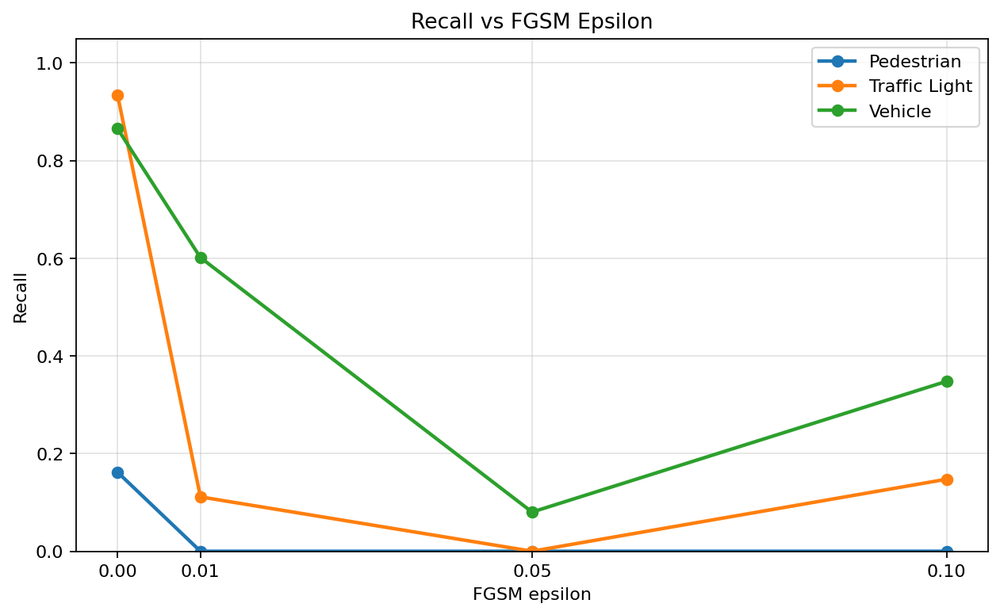

In [8]:
plot_path = PLOTS_DIR / "recall_vs_epsilon.png"
display(Image(filename=str(plot_path), width=850))


## 11. Adversarial Image Examples

Each saved figure contains:

```text
clean image | amplified perturbation | adversarial image
```

The perturbation panel is intentionally amplified so humans can see the pattern.
The actual adversarial image shows what the model receives.


### Pedestrian

**epsilon = 0.01**

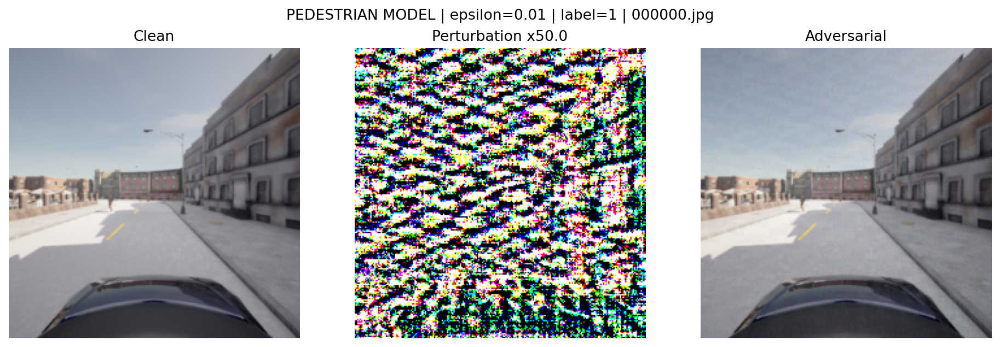

**epsilon = 0.05**

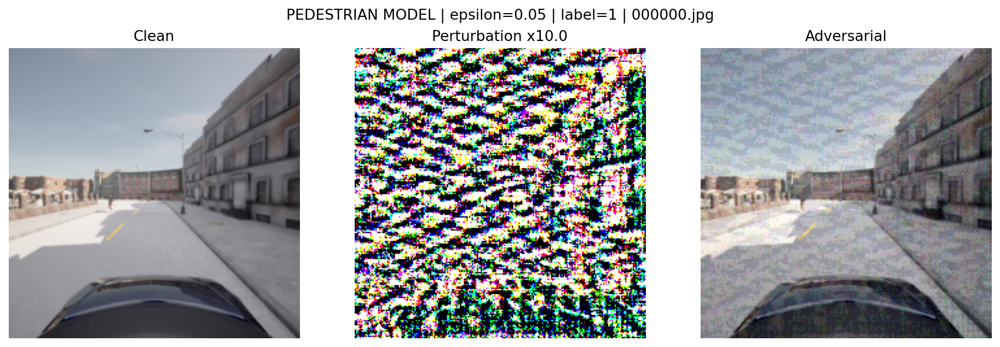

**epsilon = 0.1**

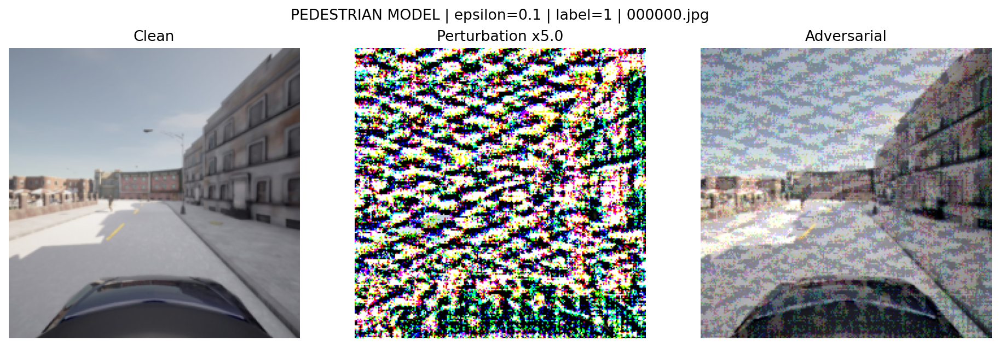

### Traffic Light

**epsilon = 0.01**

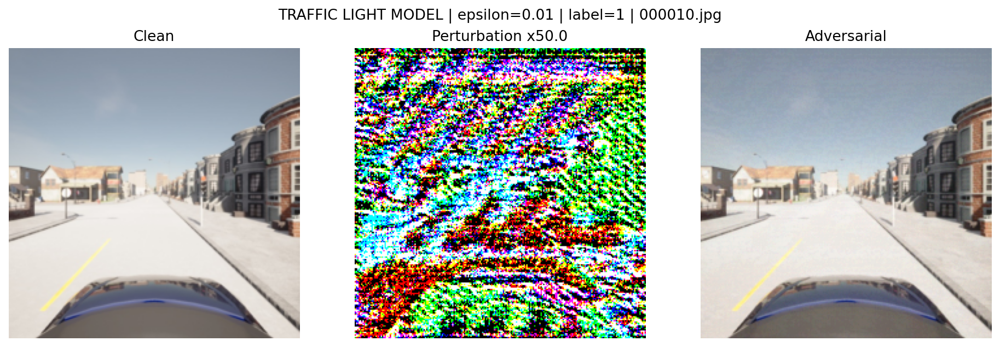

**epsilon = 0.05**

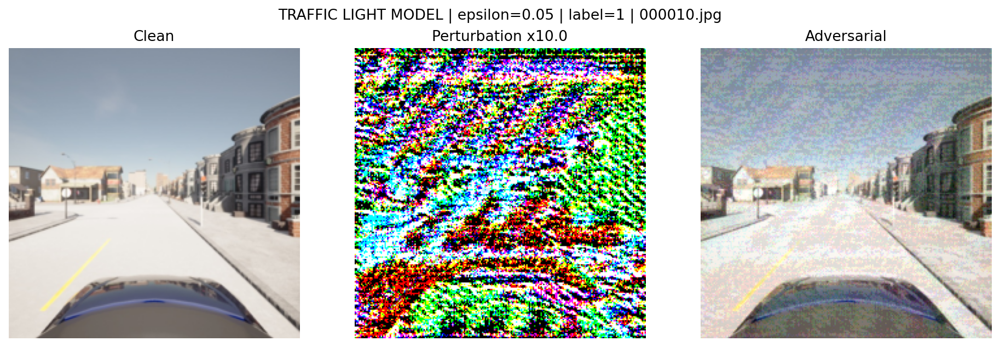

**epsilon = 0.1**

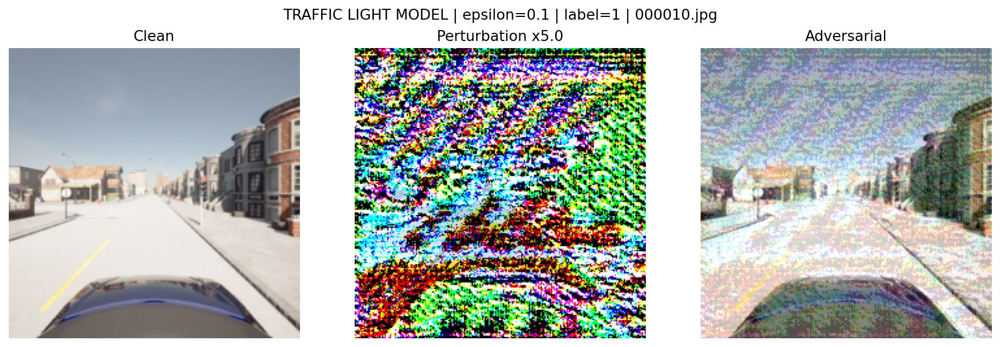

### Vehicle

**epsilon = 0.01**

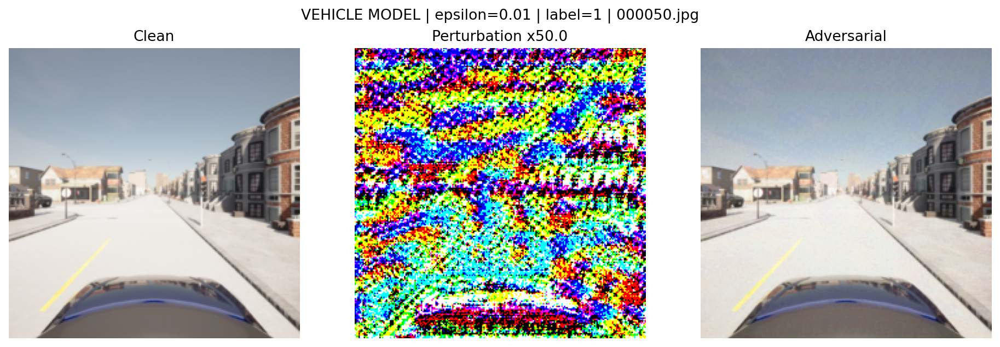

**epsilon = 0.05**

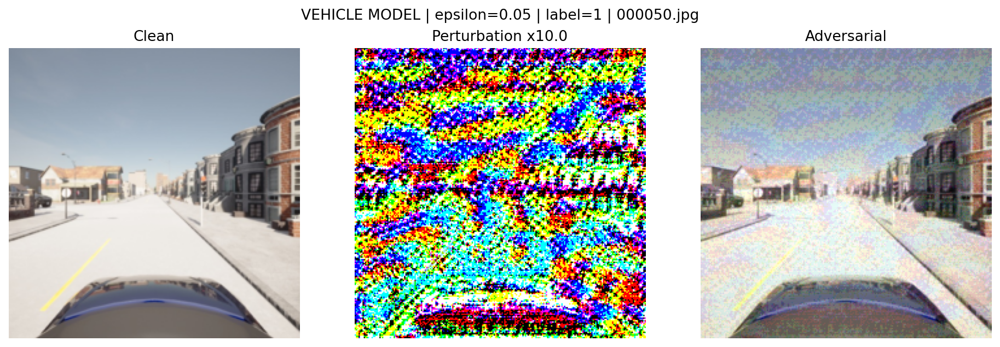

**epsilon = 0.1**

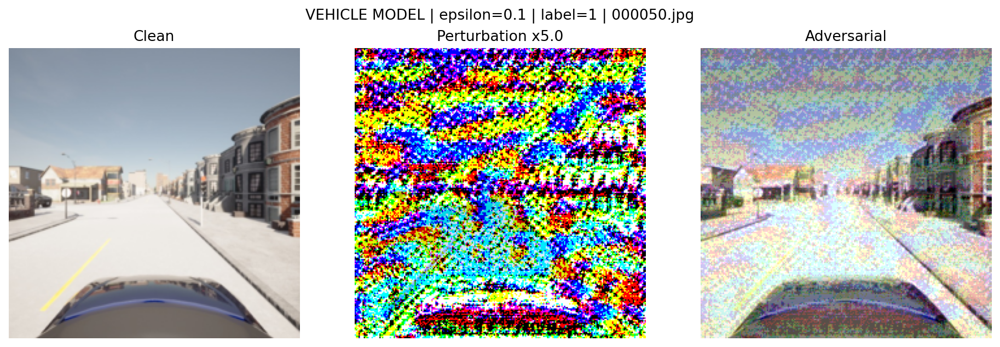

In [9]:
models = ["pedestrian", "traffic_light", "vehicle"]
epsilon_suffixes = [("0.01", "001"), ("0.05", "005"), ("0.1", "01")]

for model_name in models:
    display(Markdown(f"### {model_name.replace('_', ' ').title()}"))
    for epsilon_text, suffix in epsilon_suffixes:
        image_path = EXAMPLES_DIR / f"{model_name}_eps_{suffix}.png"
        display(Markdown(f"**epsilon = {epsilon_text}**"))
        display(Image(filename=str(image_path), width=1000))


## 12. Talking Points

- FGSM creates small pixel changes using the gradient of the loss with respect to the input image.
- At `epsilon = 0.01`, the perturbation is mostly not visible in the adversarial image.
- At `epsilon = 0.05`, visible noise starts to appear.
- At `epsilon = 0.1`, the perturbation is clearly visible.
- The traffic light and vehicle models have high clean recall, but both degrade strongly under FGSM.
- The pedestrian model already has low clean recall, and the attack reduces it to zero.
- In a safety system, recall drop is dangerous because it means more false negatives.
- False negatives can cause unsafe behavior, such as failing to brake for a pedestrian or missing a traffic light.


In [10]:
from pathlib import Path
import os
import subprocess
import sys

PROJECT_ROOT = Path("/Users/gopesh__007/carla_baseline_project")
SCRIPT_PATH = PROJECT_ROOT / "scripts" / "evaluate_adversarial.py"
VENV_PYTHON = PROJECT_ROOT / ".venv" / "bin" / "python"

PYTHON_EXE = VENV_PYTHON if VENV_PYTHON.exists() else Path(sys.executable)

# Matplotlib sometimes complains if ~/.matplotlib is not writable.
# This keeps its cache inside your project folder.
matplotlib_cache = PROJECT_ROOT / ".matplotlib_cache"
matplotlib_cache.mkdir(exist_ok=True)

env = os.environ.copy()
env["MPLCONFIGDIR"] = str(matplotlib_cache)

command = [
    str(PYTHON_EXE),
    str(SCRIPT_PATH),
    "--limit",
    "100",
    "--sample-mode",
    "random",
    "--seed",
    "42",
]

print("Running command:")
print(" ".join(command))
print()

process = subprocess.Popen(
    command,
    cwd=PROJECT_ROOT,
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
    text=True,
    bufsize=1,
    env=env,
)

for line in process.stdout:
    print(line, end="")

return_code = process.wait()

if return_code != 0:
    raise RuntimeError(f"Evaluation failed with exit code {return_code}")

print("\nEvaluation finished successfully.")
print("Results saved to:")
print(PROJECT_ROOT / "outputs" / "adversarial" / "adversarial_results.csv")
print(PROJECT_ROOT / "outputs" / "adversarial" / "plots" / "recall_vs_epsilon.png")

Running command:
/Users/gopesh__007/carla_baseline_project/.venv/bin/python /Users/gopesh__007/carla_baseline_project/scripts/evaluate_adversarial.py --limit 100 --sample-mode random --seed 42

0.00s - Debugger warning: It seems that frozen modules are being used, which may
0.00s - make the debugger miss breakpoints. Please pass -Xfrozen_modules=off
0.00s - to python to disable frozen modules.
0.00s - Note: Debugging will proceed. Set PYDEVD_DISABLE_FILE_VALIDATION=1 to disable this validation.
[INFO] Project root: /Users/gopesh__007/carla_baseline_project
[INFO] Device: cpu
[INFO] Evaluating 100 randomly sampled validation samples (seed=42).
[INFO] FGSM epsilons: 0.01, 0.05, 0.1
PEDESTRIAN MODEL
[INFO] Loading checkpoint: /Users/gopesh__007/carla_baseline_project/models/pedestrian_model.pth
[INFO] Using 100 randomly sampled validation rows (seed=42).
[INFO] No image column found. Pairing labels with sorted image files.
[INFO] Loaded 100 samples for pedestrian.
[INFO] Evaluating pedest